In [73]:
# %load simple_regression_forecasting.py
# import necessary modules

import pandas as pd
import numpy as np
from scipy import stats
from datetime import datetime
from sklearn import preprocessing
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors

################################################################################
################################################################################
# some preprocessing functions, must of all to remove outliers

def remove_q_outliers(data: pd.DataFrame, alpha=1.5):
    df = data.copy(deep=True)
    (ind, series) = tuple(df.shape)
    for s in range(series):
        serie = df.iloc[:, s]
        med = np.median(serie)  # most seen value
        q25, q75 = np.percentile(serie, 25), np.percentile(serie, 75)
        iqr = q75 - q25
        qoutliers1 = serie < q25 - alpha * iqr
        qoutliers2 = serie > q75 + alpha * iqr
        serie[qoutliers1] = np.nan
        serie[qoutliers2] = np.nan
        serie.fillna(med, inplace=True)
        df.iloc[:, s] = serie
    return df


def remove_z_outliers(data: pd.DataFrame, beta=3, gamma=0.6745):
    df = data.copy(deep=True)
    (ind, series) = tuple(df.shape)
    for s in range(series):
        serie = df.iloc[:, s]
        med = np.median(serie)  # most seen value
        mad = np.median(np.abs(serie - med))
        zoutlier = (gamma * (serie - med)) / mad > beta
        serie[zoutlier] = np.nan
        serie.fillna(med, inplace=True)
        df.iloc[:, s] = serie
    return df


# :/
def remove_outliers(data: pd.DataFrame, alpha=1.5, beta=3, gamma=0.6745):
    """
    this function removes outliers with two types of test:
    iqr test and z-score test, the z-score test has been modified to use the
    median, as the usual z-score is radically affected by outliers
    - alpha is a parameter for the iqr test
    - beta, gamma are for the z-mod-score test
    """
    df = data.copy(deep=True)
    (ind, series) = tuple(df.shape)
    for s in range(series):
        # extract the column
        serie = df.iloc[:, s]
        # compute needed stats
        q25, q75 = np.percentile(serie, 25), np.percentile(serie, 75)
        iqr = q75 - q25
        med = np.median(serie)  # most seen value
        mad = np.median(np.abs(serie - med))

        # z-score test
        zoutlier = (gamma * (serie - med)) / mad > beta

        # iqr outliers test
        qoutliers1 = serie < q25 - alpha * iqr
        qoutliers2 = serie > q75 + alpha * iqr

        # put and remove NaN values
        serie[zoutlier] = np.nan
        serie[qoutliers1] = np.nan
        serie[qoutliers2] = np.nan
        serie.fillna(med, inplace=True)
        df.iloc[:, s] = serie
    return df

################################################################################
################################################################################

def split_between_train_and_val(df: pd.DataFrame, steps_in, steps_out):
    train_df = df.head(len(df)-steps_in-steps_out).copy()
    val_df = df.tail(steps_in+steps_out).copy()
    val_df_X = val_df.head(steps_in).copy()
    val_df_y = val_df.tail(steps_out).copy()
    return (train_df, val_df_X, val_df_y)

def transfrom_to_list_of_df(df: pd.DataFrame):
    (index, series) = tuple(df.shape)
    l = []
    for ser in range(series):
        dfc = pd.DataFrame(df.iloc[:, ser]).copy()
        l.append(dfc)

    return l

def transform_to_list_of_tuples(df: pd.DataFrame, steps_in, steps_out):
    (index, series) = tuple(df.shape)

    (train_df, val_df_X, val_df_y) = split_between_train_and_val(df, steps_in, steps_out)

    l_train = transfrom_to_list_of_df(train_df)
    l_val_X = transfrom_to_list_of_df(val_df_X)
    l_val_y = transfrom_to_list_of_df(val_df_y)

    tuple_of_series = []

    for i in range(series):
        (X,y) = splitter(l_train[i], steps_in, steps_out)

        values_val_X =  l_val_X[i].values
        values_val_y = l_val_y[i].values

        validation_X =  values_val_X.reshape((len(values_val_X),))
        validation_y = values_val_y.reshape((len(values_val_y),))

        tuple_of_series.append([(X, y), (validation_X, validation_y)])

    return tuple_of_series


def splitter(df: pd.DataFrame, steps_in: int, steps_out: int):
    """
    :param df:  pandas DataFrame to split
    :param steps_in: number of values in the in data
    :param steps_out:  number of values in the out data
    :return: tuple (X,y) of examples
    """
    (index, series) = tuple(df.shape)
    X = list()
    y = list()
    sample_size = steps_in + steps_out
    for i in range(index-sample_size):
        # define the bounds
        out_left = i + steps_in
        out_right = out_left + steps_out
        in_right = i + steps_in
        in_left = i

        # extract the data
        in_values = df.iloc[in_left:in_right, :].values
        out_values = df.iloc[out_left:out_right, :].values

        # reshape
        X_values = np.array(in_values).reshape((len(in_values)*series,))
        y_values = np.array(out_values).reshape((len(out_values) * series,))

        X.append(X_values)
        y.append(y_values)

    return np.array(X), np.array(y)

def smape_loss(y_true, y_pred):
    """
    Error function
    :param y_true:
    :param y_pred:
    :return:
    """
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 200.0
    diff = np.abs(y_true - y_pred) / denominator
    diff[denominator == 0] = 0.0
    return np.mean(diff)


def train_for_model(lot, model):
    models = {}
    for i in range(len(lot)):
        m = model()
        [(X, y), (val_X, val_y)] = lot[i]
        m.fit(X, y)
        models[i] = m

    return models


def predict_horizon(df, models, steps_in, steps_out):
    (index, series) = tuple(df.shape)
    tail = df.tail(steps_in).copy()
    preds = []

    # predict for each series
    for ser in range(series):
        val = tail.iloc[:, ser].values
        val_X = np.array(val).reshape((len(val),))
        pred_y = models[ser].predict(val_X.reshape(1, -1))
        preds.append(pred_y)

    # create new index
    index_range = create_next_index(df, steps_out)

    # transfrom the predictions in a dataframe
    preds = np.array(preds)
    preds = preds.reshape((steps_out, series))
    preds = pd.DataFrame(preds, index=index_range)
    preds = preds.rename(columns=create_rename_dic())

    return preds


def main_by_model(df, model, steps_in, steps_out, loss_function):
    # get everything
    lot = transform_to_list_of_tuples(df, steps_in, steps_out)
    models = train_for_model(lot, model)

    score = []
    for i in range(len(lot)):
        [(X, y), (val_X, val_y)] = lot[i]
        val_X_pred = models[i].predict(val_X.reshape(1, -1))
        v = loss_function(val_X_pred, val_y)
        # print(v)
        score.append(v)

    preds = predict_horizon(df, models, steps_in, steps_out)
    preds = preds.rename(columns=create_rename_dic())

    return (preds, models, score)

def create_next_index(df: pd.DataFrame, steps_out):
    last_day = df.index[-1]
    prob_index_range = pd.date_range(start=last_day, periods=steps_out+1)
    index_range = prob_index_range[1:]

    return index_range

def predict_next(df: pd.DataFrame, models, steps_in, steps_out):
    (index, series) = tuple(df.shape)
    index_range = create_next_index(df, steps_out)

    if index == steps_in:
        preds = []

        for serie in range(series):
            # transform in predictable array
            val = df.iloc[:, serie].values
            val = np.array(val).reshape((len(val),))

            pred = models[serie].predict(val.reshape(1, -1))
            preds.append(pred)

        preds = np.array(preds)
        preds = preds.reshape((steps_out, series))

        preds = pd.DataFrame(preds, index=index_range)
        preds = preds.rename(columns=create_rename_dic())

        return preds

    return None

# this function is for this series
def create_rename_dic():
    rn_dic = {}

    for i in range(45):
        rn_dic[i] = "series-" + str(i+1)

    return rn_dic

def plot_by_series(df, models, steps_in, steps_out, figsize=(16,10)):

    val_df = df.loc[df.index[-(steps_in+steps_out):-steps_out]]
    val_df = predict_next(val_df, models, steps_in, steps_out)
    preds = predict_horizon(df, models, steps_in, steps_out)

    for column in df.columns:
        df_c = pd.DataFrame(df.tail(100)[column])
        val_df_c =  pd.DataFrame(val_df[column])
        preds_c = pd.DataFrame(preds[column])

        plt.figure(figsize=figsize)
        plt.plot(df_c, color="blue", linestyle="-")
        plt.plot(val_df_c, color="green", linestyle="-")
        plt.plot(preds_c, color="red", linestyle="--")
        plt.legend(["Train series", "Validation series", "Predicted series"])
        plt.title("Predictions using the LinearRegression model on " + str(column))

        plt.show()

def plot_all(df, models, steps_in, steps_out, figsize=(16,10)):

    val_df = df.loc[df.index[-(steps_in+steps_out):-steps_out]]
    val_df = predict_next(val_df, models, steps_in, steps_out)
    preds = predict_horizon(df, models, steps_in, steps_out)

    df_plot = df.tail(100)

    plt.figure(figsize=figsize)
    plt.plot(df_plot, color="blue", linestyle="-")
    plt.plot(val_df, color="green", linestyle="-")
    plt.plot(preds, color="red", linestyle="--")
    plt.legend(["Train series", "Validation series", "Predicted series"])
    plt.title("Predictions using the LinearRegression model")

    plt.show()


def plot_several(list_of_df, figsize=(16,10)):

    plt.figure(figsize=figsize)
    c = list(colors.BASE_COLORS)

    for i in range(len(list_of_df)):
        color = c[i % len(c)]
        plt.plot(list_of_df[i], color=color)

    plt.show()

In [74]:
from sklearn.gaussian_process import GaussianProcessRegressor as GPR
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split
import xgboost as xgb

In [75]:
def to_array(d: pd.DataFrame):
    ar = []
    for column in d.columns:
        v = d[column].values
        v = np.array(v)
        v = v.reshape((len(v),))
        ar.append(v)
    
    return np.array(ar)

In [76]:
def big_array_splitter(ar, steps_in, steps_out):
    # now to valuabel examples:
    in_out_length = steps_in + steps_out
    limit = len(ar[0]) - in_out_length

    # still big array with 45 columns
    X = []
    y = []
    for s in range(45):
        Xs = []
        Ys = []
        for d in range(limit):
            in_left = d
            in_right = d + steps_in
            out_left = d + steps_in
            out_right = d + steps_in + steps_out
            xs = ar[s][in_left : in_right]
            ys = ar[s][out_left : out_right]
        
            # xs = np.array(xs)
            # ys = np.array(ys)
            Xs.append(xs)
            Ys.append(ys)
        X.append(Xs)
        y.append(Ys)
    
    X = np.array(X)
    y = np.array(y)
    
    return (X,y)

In [77]:
def scale(d, scaler):
    rd = d.copy()
    index = rd.index
    columns = rd.columns
    rn = {}
    for i in range(len(columns)):
        rn[i] = columns[i]
    
    scaler.fit(rd)
    rd = scaler.transform(rd)
    rd = pd.DataFrame(rd, index=index)
    rd = rd.rename(columns=rn)
    
    return (rd, scaler)

def unscale(d, scaler):
    rd = d.copy()
    index = rd.index
    columns = rd.columns
    rn = {}
    for i in range(len(columns)):
        rn[i] = columns[i]
    
    rd = scaler.inverse_transform(rd)
    rd = pd.DataFrame(rd, index=index)
    rd = rd.rename(columns=rn)
    
    return rd

In [78]:
# read the csv data
df = pd.read_csv('../../train.csv', parse_dates = ['Day'], index_col='Day')
dfc = df.copy(deep=True)

In [79]:
# remove outliers
df = remove_outliers(df, beta=3.5, alpha=2)

/home/horacio/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [80]:
# the scalers work fine

std_scaler = preprocessing.StandardScaler()
mmx_scaler = preprocessing.MinMaxScaler()

(std_scaled, std_scaler) = scale(df, std_scaler)
(mmx_scaled, mmx_scaler) = scale(df, mmx_scaler)

In [81]:
# remove trending
# HERE !!!
# std_scaled = std_scaled.diff().iloc[1:]
# mmx_scaled = mmx_scaled.diff().iloc[1:]

In [82]:
# original data
steps_in = 3
steps_out = 1
(days, series) = tuple(mmx_scaled.shape)

mmx_data = to_array(mmx_scaled)
(mmx_X,mmx_y) = big_array_splitter(mmx_data, 3, 1)

std_data = to_array(std_scaled)
(std_X,std_y) = big_array_splitter(std_data, 3, 1)

In [83]:
# find the correct bounds and create the index
data_for_regression_length = days - (steps_in + steps_out)
train_size = int(data_for_regression_length * 0.7)
tail_size = data_for_regression_length - train_size

index_test = df.tail(tail_size).index

print(len(index_test))

234


In [84]:
# let's predict all the series
mmx_list_of_datasets = []
std_list_of_datasets = []

for i in range(45):
    # X_train, X_test, y_train, y_test
    mmx_t = [mmx_X[i][:train_size], mmx_X[i][train_size:], mmx_y[i][:train_size], mmx_y[i][train_size:]]
    mmx_list_of_datasets.append(mmx_t)
    
    std_t = [std_X[i][:train_size], std_X[i][train_size:], std_y[i][:train_size], std_y[i][train_size:]]
    std_list_of_datasets.append(std_t)

mmx_datasets = np.array(mmx_list_of_datasets)
std_datasets = np.array(std_list_of_datasets)

print(mmx_datasets[0][0].shape)
print(mmx_datasets[0][1].shape)

(544, 3)
(234, 3)


In [85]:
# create models, keep smape score 

mmx_models = []
mmx_preds = []

std_models = []
std_preds = []

mmx_smape_scores = []
std_smape_scores = []

for i in range(45):
    mmx_xgbmodel = xgb.XGBRegressor()
    std_xgbmodel = xgb.XGBRegressor()
    
    [mmx_X_train, mmx_X_test, mmx_y_train, mmx_y_test] = list(mmx_datasets[i])
    mmx_xgbmodel.fit(mmx_X_train, mmx_y_train)
    
    [std_X_train, std_X_test, std_y_train, std_y_test] = list(std_datasets[i])
    std_xgbmodel.fit(std_X_train, std_y_train)
    
    mmx_p = mmx_xgbmodel.predict(mmx_X_test)
    std_p = std_xgbmodel.predict(std_X_test)
    
    mmx_preds.append(mmx_p)
    std_preds.append(std_p)
    
    mmx_models.append(mmx_xgbmodel)
    std_models.append(std_xgbmodel)
    
    mmx_s = smape_loss(mmx_p, mmx_y_test)
    std_s = smape_loss(std_p, std_y_test)
    
    mmx_smape_scores.append(mmx_s)
    std_smape_scores.append(std_s)

mmx_preds = np.array(mmx_preds)
std_preds = np.array(std_preds)
mmx_smape_scores = np.array(mmx_smape_scores)
std_smape_scores = np.array(std_smape_scores)

[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[00:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [86]:
print(np.average(mmx_smape_scores))
print(np.average(std_smape_scores))

print(std_smape_scores.shape)

49.68737057099955
132.15047399969524
(45,)


In [87]:
print(mmx_preds.shape)
print(len(index_test))

(45, 234)
234


In [88]:
# transpose the matrix
mmx_preds = np.transpose(mmx_preds)
std_preds = np.transpose(std_preds)


print(mmx_preds.shape)

(234, 45)


In [89]:
# create dict
rn = create_rename_dic()

# transform the predictions to dataframes
mmx_preds = pd.DataFrame(mmx_preds, index=index_test)
std_preds = pd.DataFrame(std_preds, index=index_test)

mmx_preds = mmx_preds.rename(columns=rn)
std_preds = std_preds.rename(columns=rn)

# unscale the predictions
mmx_preds_unscaled = unscale(mmx_preds, mmx_scaler)
std_preds_unscaled = unscale(std_preds, std_scaler)

In [90]:
weigths = []
for i in range(45):
    w_mmx = 1 - mmx_smape_scores[i] / (mmx_smape_scores[i] + std_smape_scores[i])
    w_std = 1 - std_smape_scores[i] / (mmx_smape_scores[i] + std_smape_scores[i])
    weigths.append((w_mmx, w_std))
    
weighted_preds = mmx_preds_unscaled.copy()
for i in range(45):
    (w_mmx, w_std) = weigths[i]
    weighted_preds.iloc[:,i] = mmx_preds_unscaled.iloc[:,i] * w_mmx + std_preds_unscaled.iloc[:,i] * w_std

In [91]:
# I need to shift the dates
mmx_index = mmx_preds_unscaled.index

length = len(mmx_index)

print(length)
print(mmx_index.min())
print(mmx_index.max())

shift_back_index = pd.date_range(end=mmx_index.max(), periods=length+2)[:-2]
shift_forward_index = pd.date_range(start=mmx_index.min(), periods=length+2)[2:]


std_preds_unscaled.set_index(shift_back_index, inplace=True)
mmx_preds_unscaled.set_index(shift_back_index, inplace=True)
weighted_preds.set_index(shift_back_index, inplace=True)

new_df = mmx_preds_unscaled.copy()
new_df.set_index(shift_back_index, inplace=True)

234
2016-12-30 00:00:00
2017-08-20 00:00:00


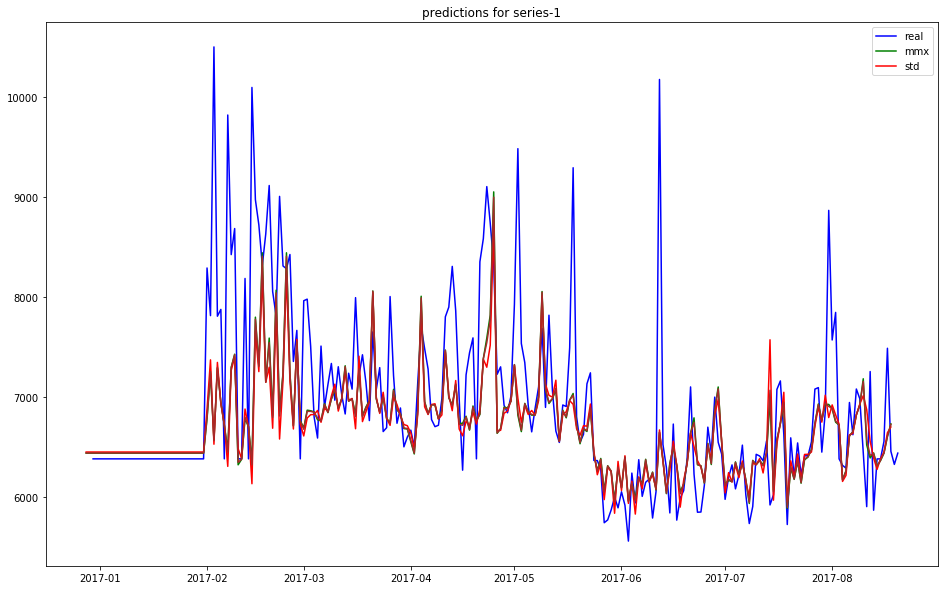

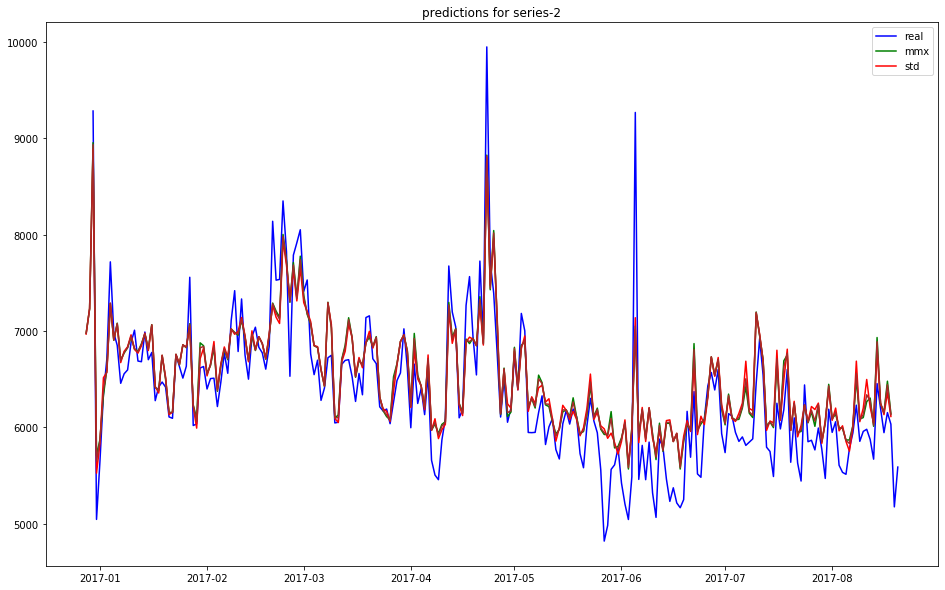

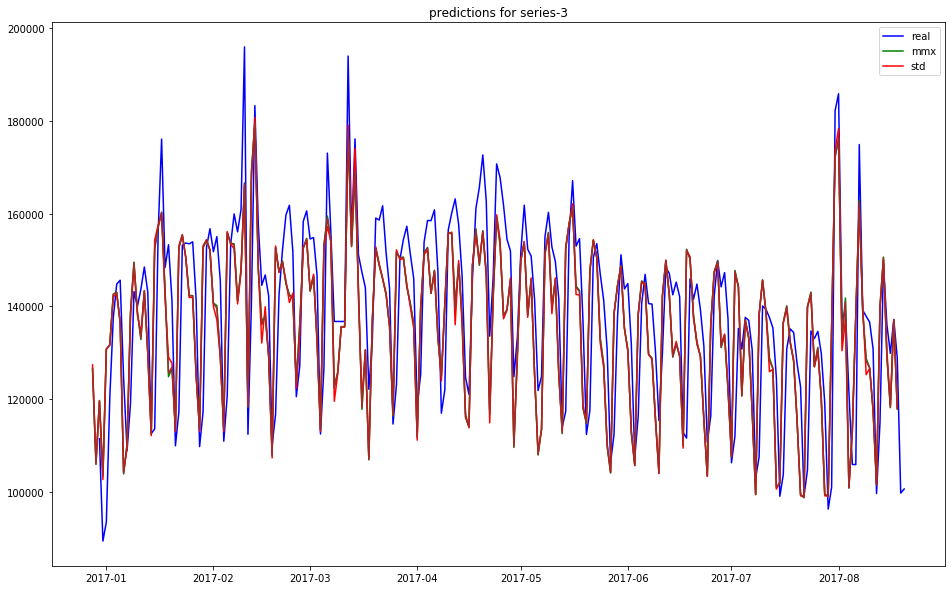

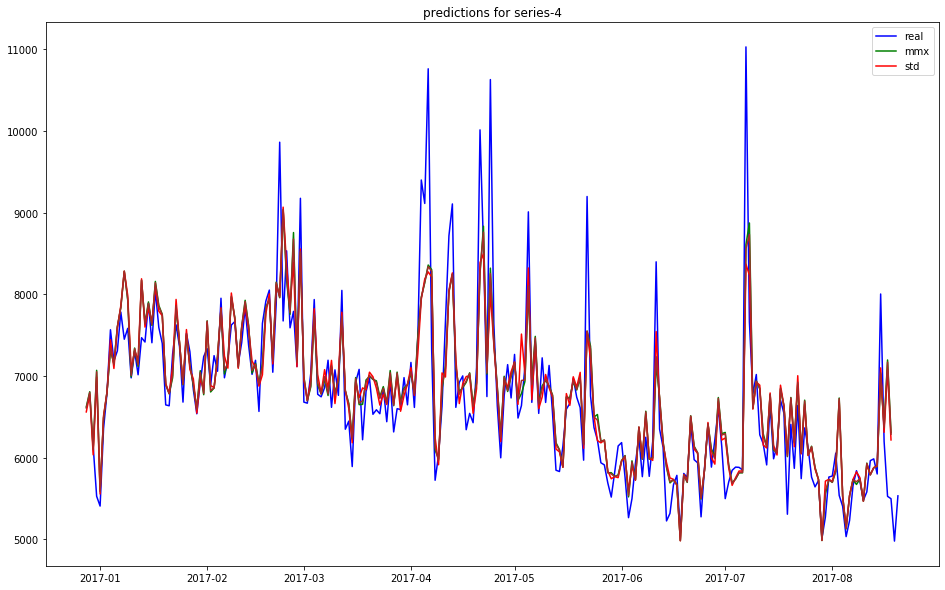

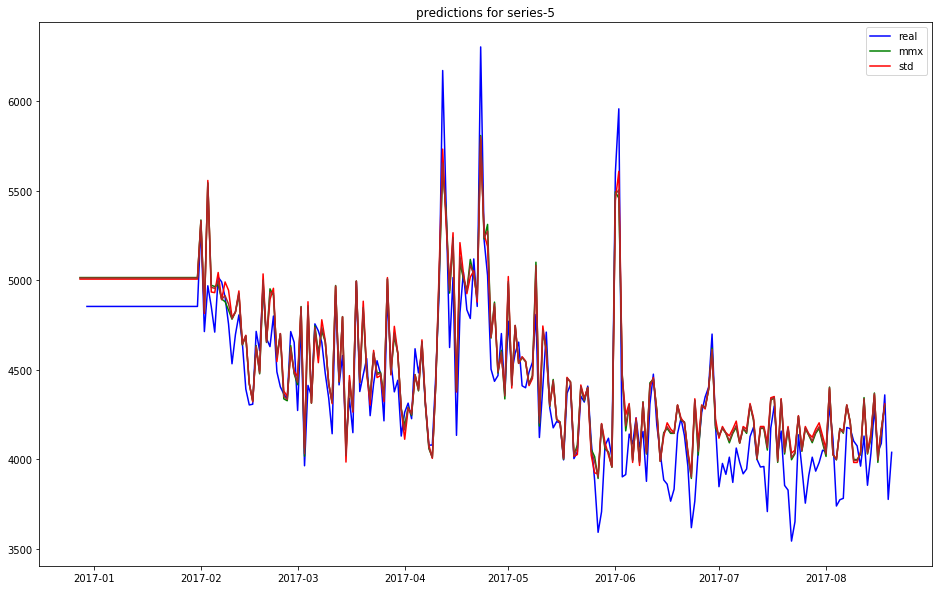

...

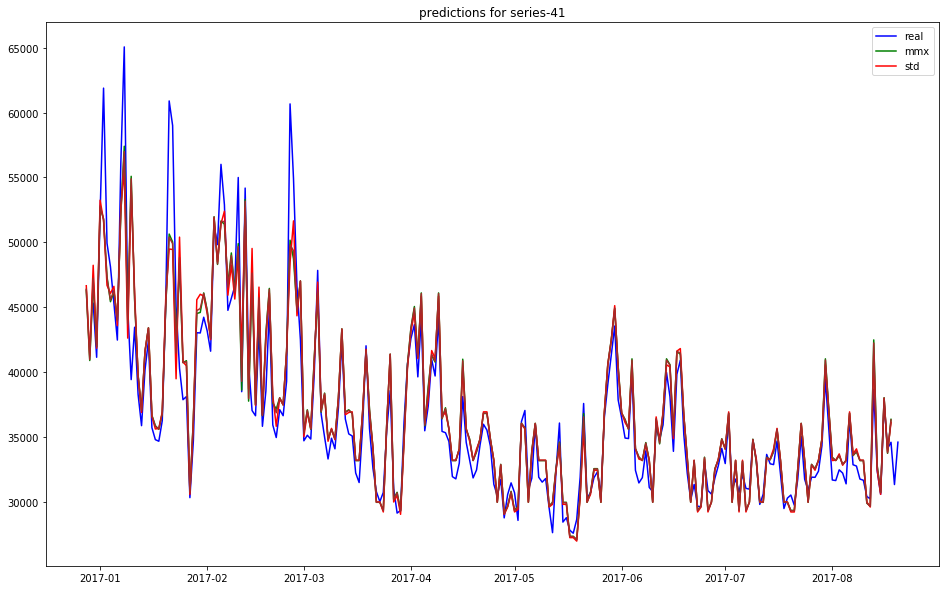

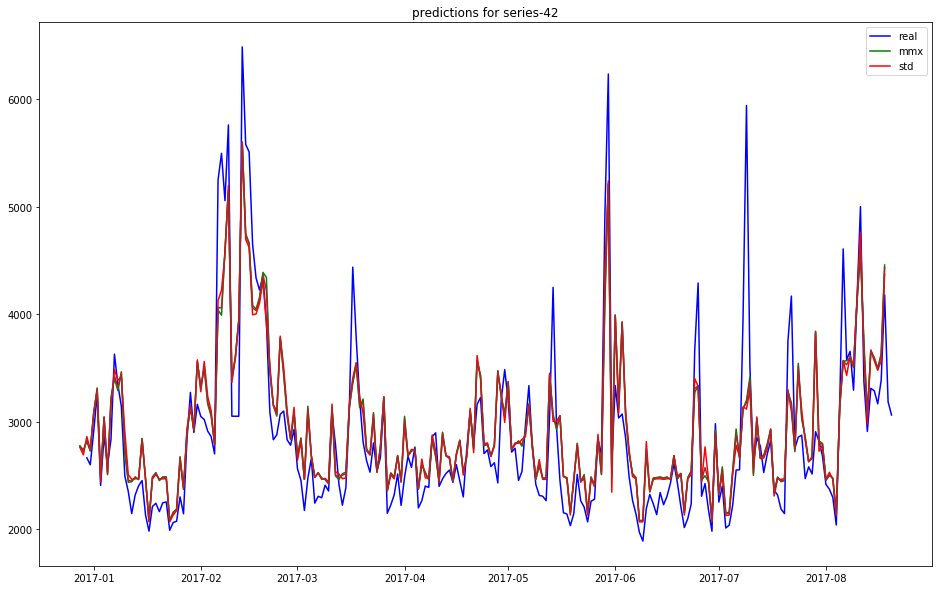

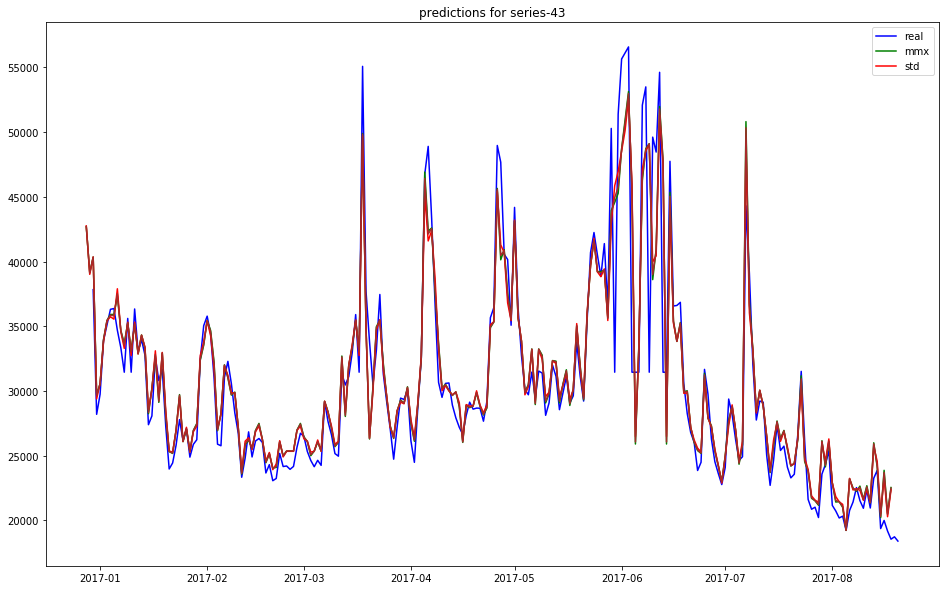

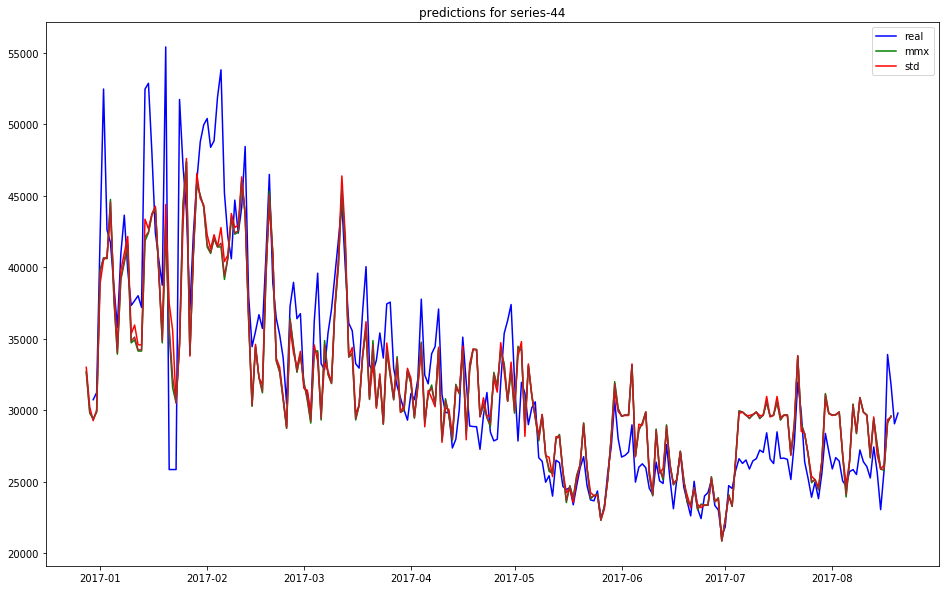

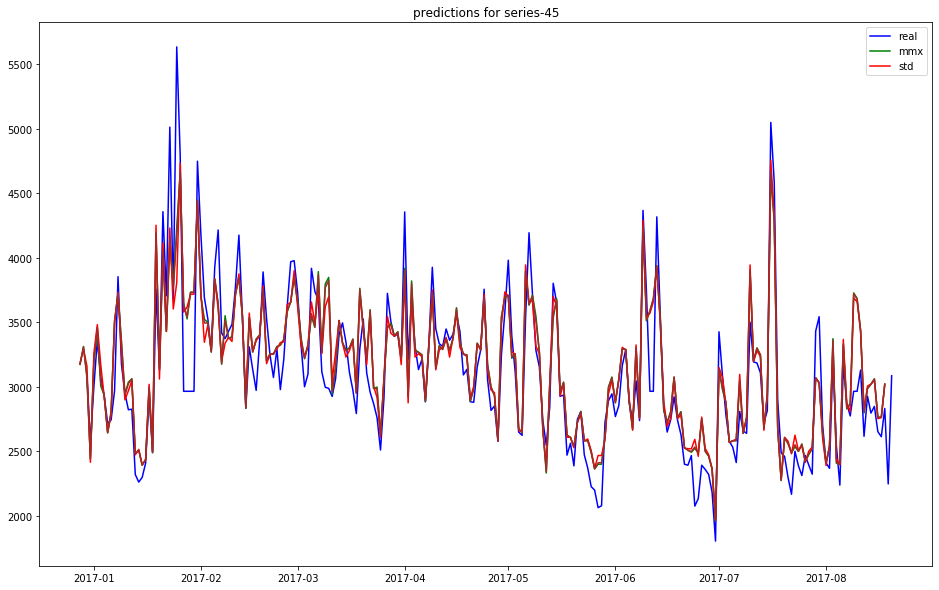

In [92]:
for column in df.columns:
    plt.figure(figsize=(16,10))
    
    plt.plot(df.tail(tail_size)[column], color='blue')
    plt.plot(new_df[column], color='green')
    plt.plot(std_preds_unscaled[column], color='red')
    plt.plot(weighted_preds[column], color='brown')
    
    plt.legend(['real', 'mmx', 'std'])
    plt.title('predictions for ' + str(column))

    plt.show()

In [95]:
print(np.array(df.iloc[:,0].values).shape)

(782,)


In [97]:
w_smape_scores = []
for i in range(45):
    y1 = np.array(weighted_preds.iloc[:,i].values)
    y2 = np.array(df.tail(tail_size).iloc[:,i])
    v = smape_loss(y1, y2)
    w_smape_scores.append(v)

w_smape_scores = np.array(w_smape_scores)

In [170]:
print(w_smape_scores)

[ 7.43350062  7.99664503 12.16009027  9.82393038  6.58229561 19.1289239
 13.87254533 12.70246158 20.27668789 16.11509526 12.71563706 13.23858042
 11.23500367 11.92110254 10.6489456  15.34512933 11.58025625 14.42168766
 13.9909077  17.40483019 11.69013526 26.70945864 22.16719579 13.93107167
 11.40570002 15.33387842 13.73735094 14.19213126 15.67027431 12.48198384
 24.06074696 17.07210649 16.87572815 14.27631588 19.47995354 19.05410553
 20.31083486 17.41674559 17.42823416 27.62641034 12.22834819 17.44087539
 13.44658084 11.73997903 14.79696541]


In [171]:
print(np.average(w_smape_scores))

15.092608151478693


In [172]:
print(smape_loss(weighted_preds, df.tail(tail_size)))

series-1      5.872384
series-2      4.212802
series-3      8.330912
series-4      4.456699
series-5      3.287157
series-6     16.755182
series-7      6.585928
series-8      5.351577
series-9      9.245058
series-10     7.283461
series-11     6.916139
series-12     7.970574
series-13     5.574796
series-14     6.842842
series-15     4.208061
series-16    10.990665
series-17     6.283264
series-18     8.809084
series-19     9.508222
series-20    11.625414
series-21     7.006591
series-22    10.420414
series-23    10.800631
series-24     6.395106
series-25     5.820014
series-26     8.418382
series-27     9.502339
series-28     8.632237
series-29    10.791500
series-30     7.467296
series-31    15.269081
series-32    10.476072
series-33    11.496745
series-34    10.355781
series-35    13.707418
series-36     8.523388
series-37    16.914861
series-38     9.976630
series-39     8.277826
series-40    22.041257
series-41     3.890075
series-42     8.738801
series-43     4.892442
series-44  

In [187]:
# let's try to forecast the future
future_length = 21

# dict + index
rn_dict = create_rename_dic()
preds_index = create_next_index(df, 21)

# remember to scale and unscale
last_days_mmx = mmx_scaled.tail(steps_in).copy()
last_days_std = std_scaled.tail(steps_in).copy()

last_days_mmx = np.array(last_days_mmx.values)
last_days_mmx = np.transpose(last_days_mmx)

last_days_std = np.array(last_days_std.values)
last_days_std = np.transpose(last_days_std)

# create virgin dataframe
future_mmx = pd.DataFrame(np.zeros((21,45)), index=preds_index)
future_std = pd.DataFrame(np.zeros((21,45)), index=preds_index)

future_mmx = future_mmx.rename(columns=rn_dict)
future_std = future_std.rename(columns=rn_dict)

# now predict
for i in range(steps_in):
    future_extract_mmx = future_mmx.iloc[:i,:]
    future_extract_std = future_std.iloc[:i,:]
    
    past_extract_mmx = last_days_mmx[:, i:]
    past_extract_std = last_days_std[:, i:]
    
    # pass future extract to np array
    future_extract_mmx = np.transpose(np.array(future_extract_mmx.values))
    future_extract_std = np.transpose(np.array(future_extract_std.values))
        
    for s in range(45):
        model_mmx = mmx_models[s]
        model_std = std_models[s]
        
        fe_mmx = future_extract_mmx[s]
        pe_mmx = past_extract_mmx[s]
        
        fe_std = future_extract_std[s]
        pe_std = past_extract_std[s]
        
        if len(fe_mmx) == 0:
            in_ar_mmx = pe_mmx
        elif len(pe_mmx) == 0:
            in_ar_mmx = fe_mmx
        else:
            in_ar_mmx = np.concatenate([pe_mmx, fe_mmx])
            
        if len(fe_std) == 0:
            in_ar_std = pe_std
        elif len(pe_std) == 0:
            in_ar_std = fe_std
        else:
            in_ar_std = np.concatenate([pe_std, fe_std])
            
        # print(in_ar)
        
        out_ar_mmx = model_mmx.predict(in_ar_mmx.reshape(1,-1))
        out_ar_std = model_std.predict(in_ar_std.reshape(1,-1))
        
        
        future_mmx.iloc[i,s] = out_ar_mmx
        future_std.iloc[i,s] = out_ar_std
        
print('here')
        
for i in range(future_length - steps_in):
    future_extract_mmx = future_mmx.iloc[i:i+steps_in,:]
    # pass future extract to np array
    future_extract_mmx = np.transpose(np.array(future_extract_mmx))
    
    future_extract_std = future_std.iloc[i:i+steps_in,:]
    # pass future extract to np array
    future_extract_std = np.transpose(np.array(future_extract_std))
    
    for s in range(45):
        # print('series-'+str(s+1))
        model_mmx = mmx_models[s]
        model_std = std_models[s]
        
        fe_mmx = future_extract_mmx[s]
        fe_std = future_extract_std[s]
        
        in_ar_mmx = fe_mmx
        in_ar_std = fe_std
        
        # print(in_ar)
            
        out_ar_mmx = model_mmx.predict(in_ar_mmx.reshape(1,-1))
        out_ar_std = model_std.predict(in_ar_std.reshape(1,-1))
        
        
        future_mmx.iloc[i+steps_in,s] = out_ar_mmx
        future_std.iloc[i+steps_in,s] = out_ar_std

here


In [188]:
future_mmx_unscaled = unscale(future_mmx, mmx_scaler)
future_std_unscaled = unscale(future_std, std_scaler)

In [191]:
weighted_future = future_mmx_unscaled.copy()

for i in range(45):
    (w_mmx, w_std) = weigths[i]
    weighted_future.iloc[:,i] = future_mmx_unscaled.iloc[:,i] * w_mmx + future_std_unscaled.iloc[:,i] * w_std

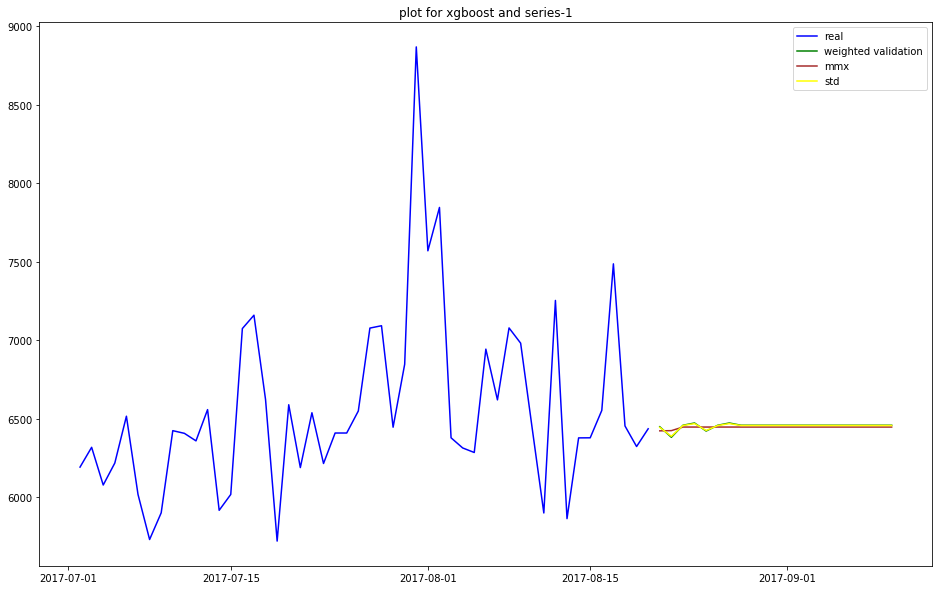

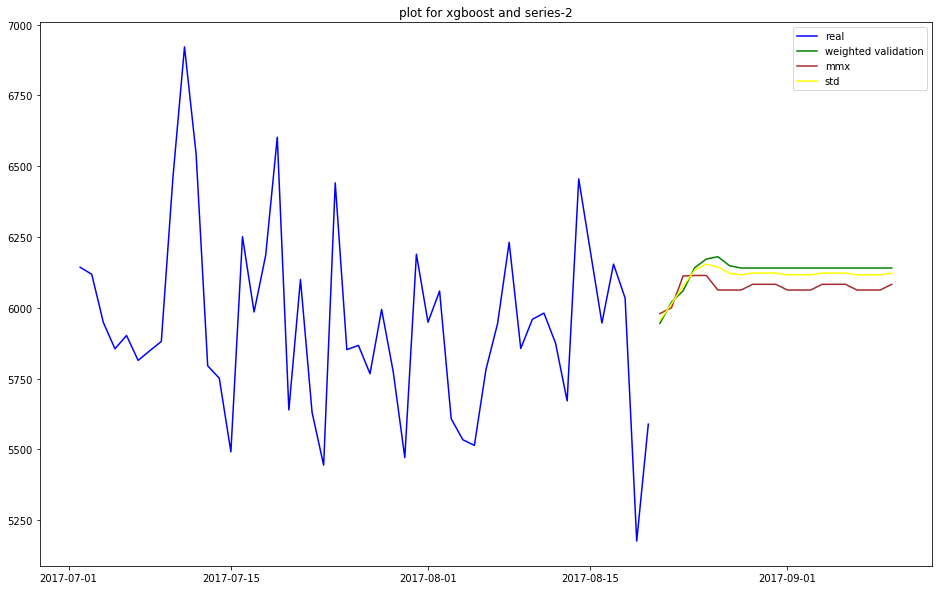

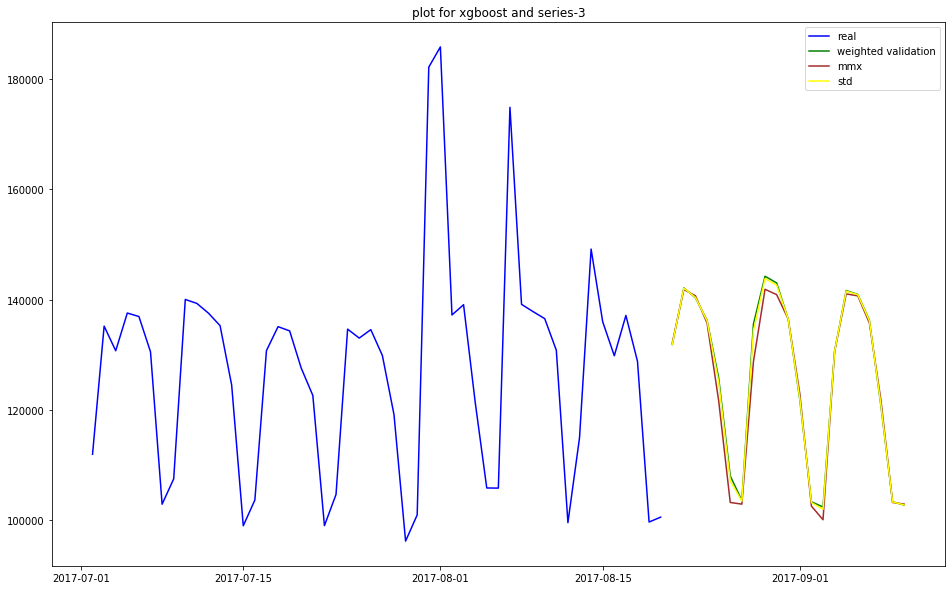

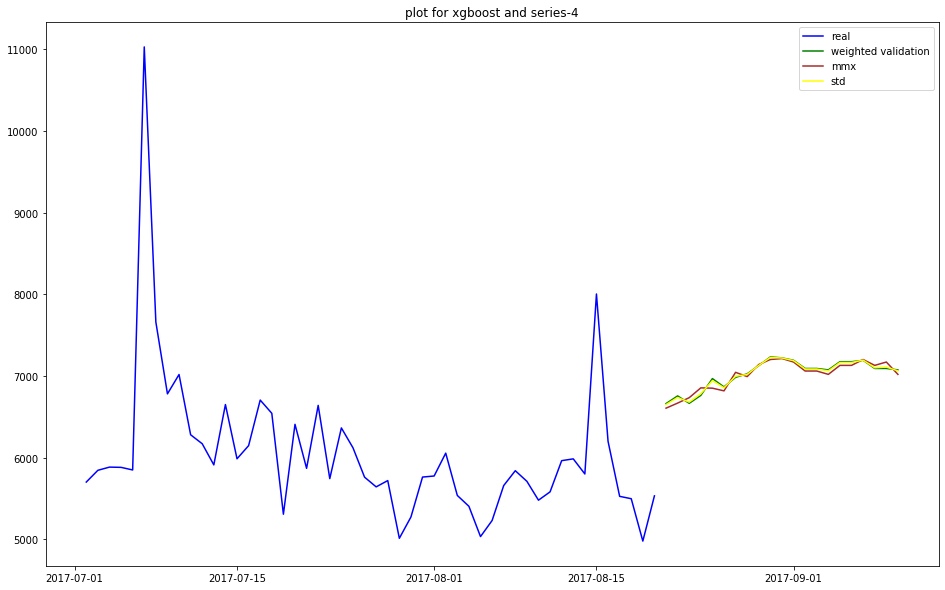

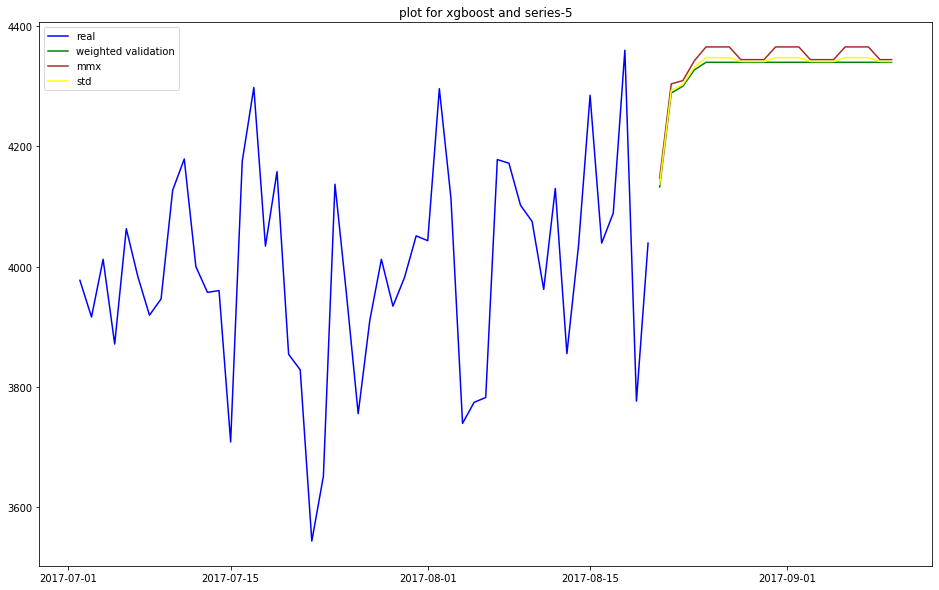

...

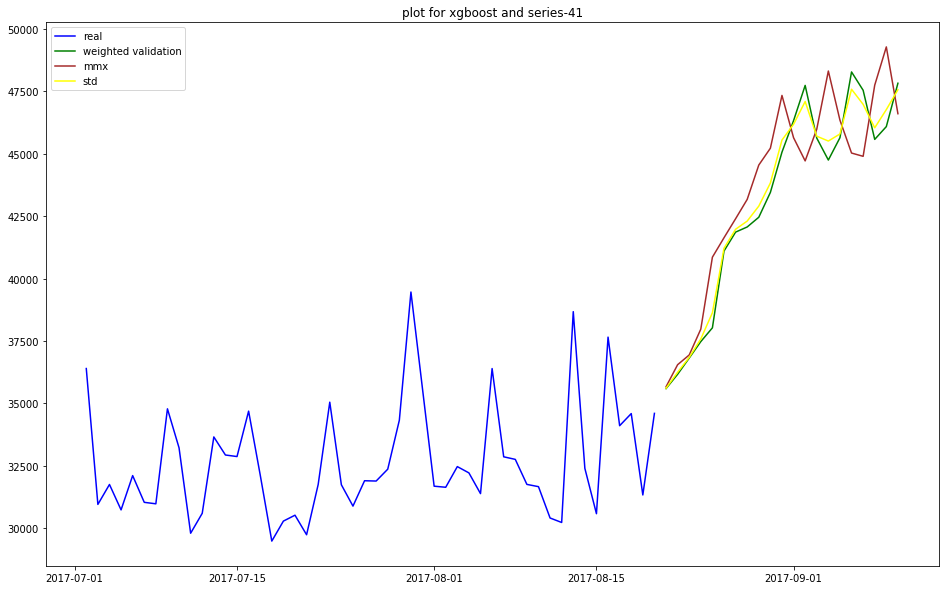

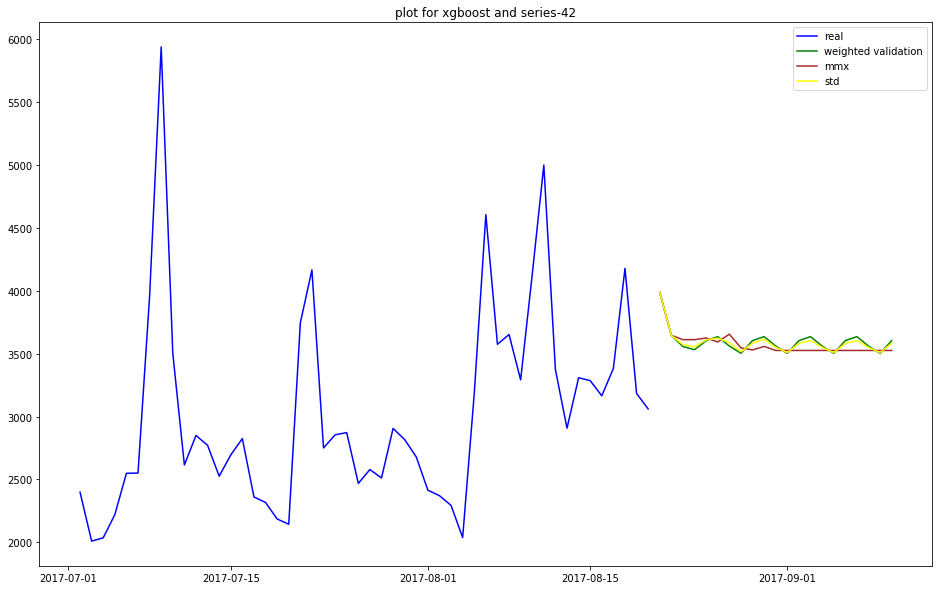

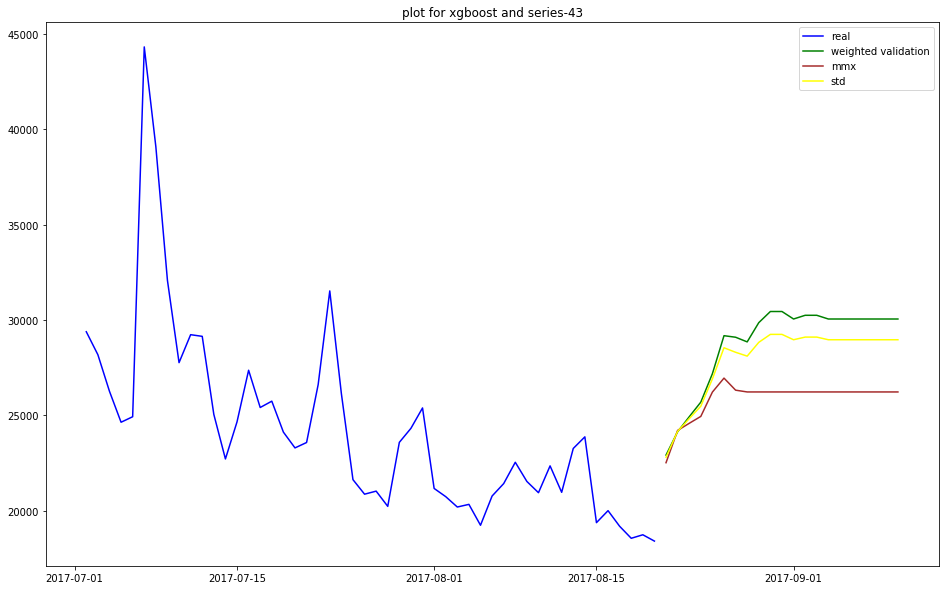

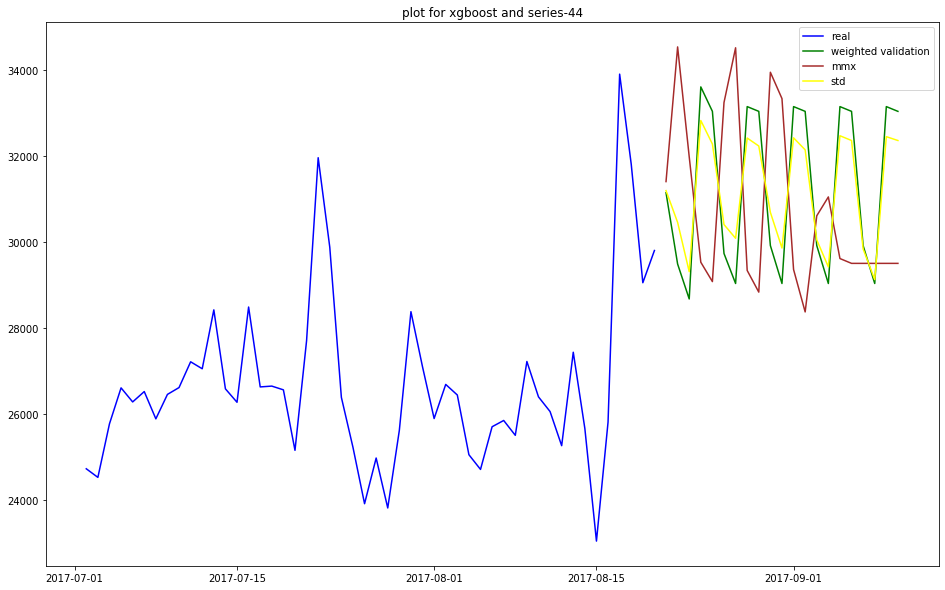

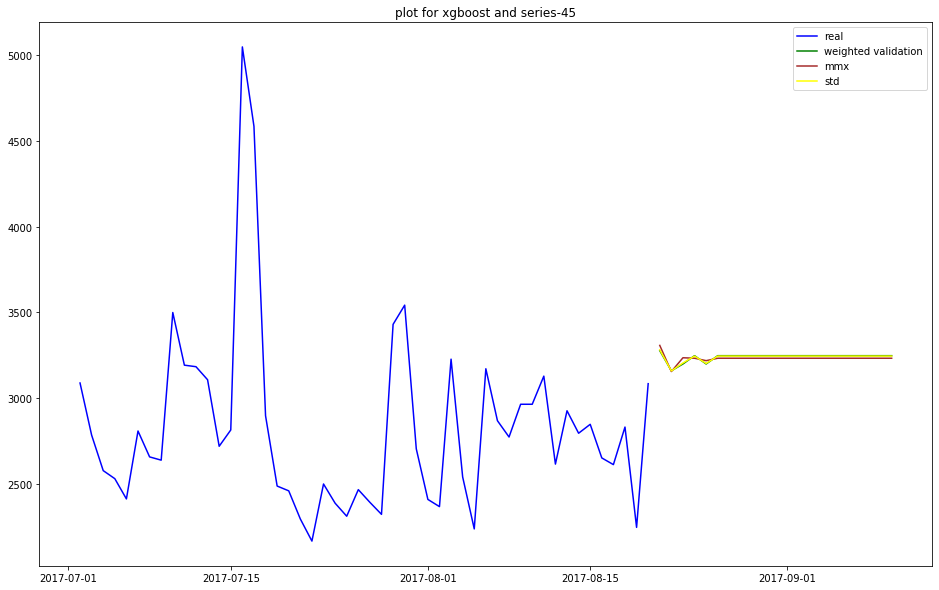

In [194]:
for column in df.columns:
    plt.figure(figsize=(16,10))
    plt.plot(df.tail(50)[column], color='blue')
    # plt.plot(weighted_preds[column], color='red')
    plt.plot(future_mmx_unscaled[column], color='green')
    plt.plot(future_std_unscaled[column], color='brown')
    plt.plot(weighted_future[column], color='yellow')
    plt.legend(['real', 'weighted validation', 'mmx', 'std', 'weighted future'])
    plt.title('plot for xgboost and ' + str(column))
    plt.show()

In [206]:
new_df = weighted_future.copy()

new_df = 1/3 * future_mmx_unscaled + 1/3 * future_std_unscaled + 1/3 * weighted_future


new_dfc = new_df.copy()

shift_back_index = pd.date_range(end=new_df.index.max(), periods=21+1)[:-1]

new_dfc.set_index(shift_back_index, inplace=True)

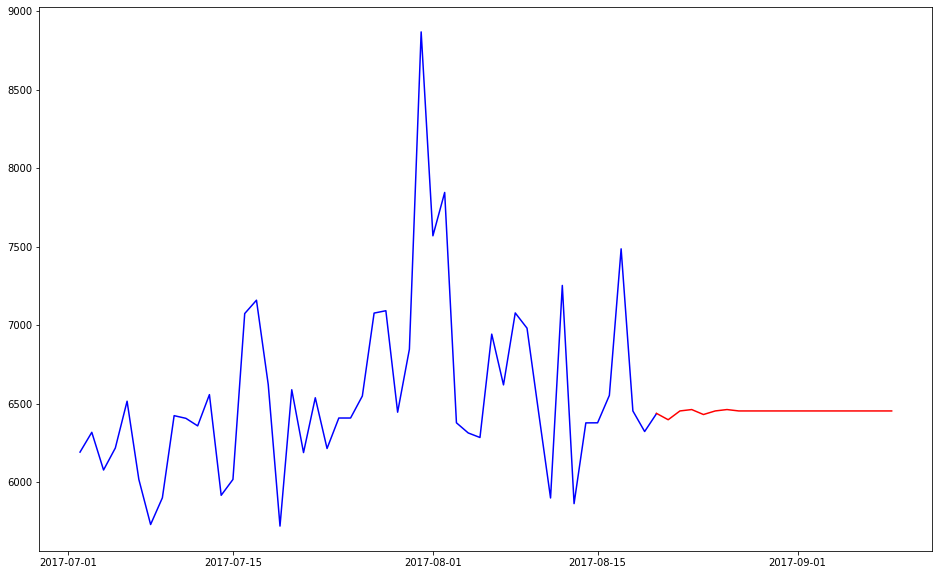

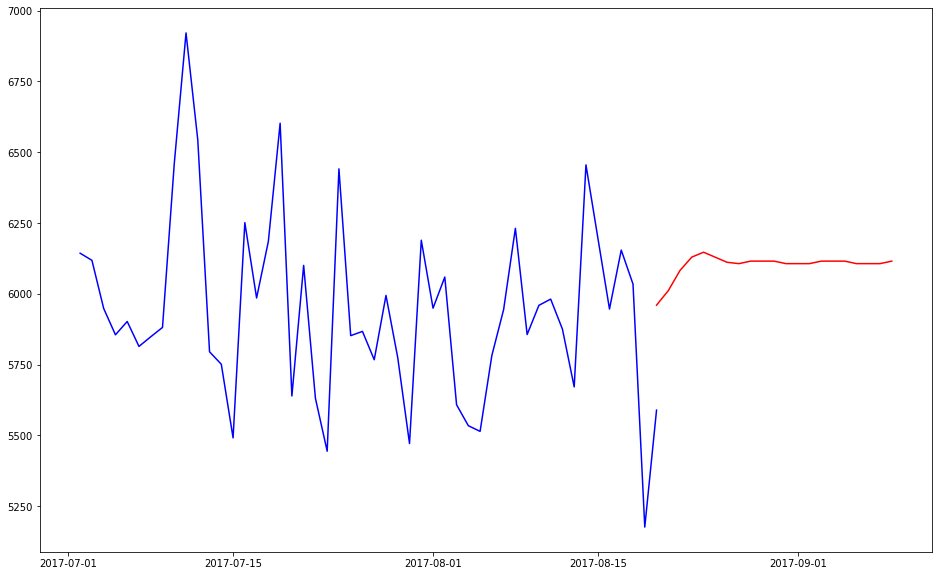

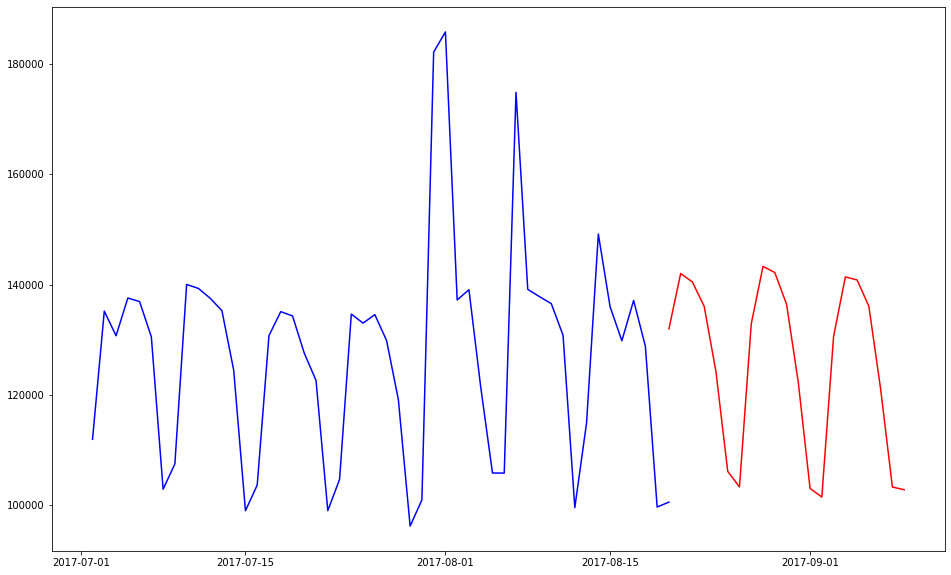

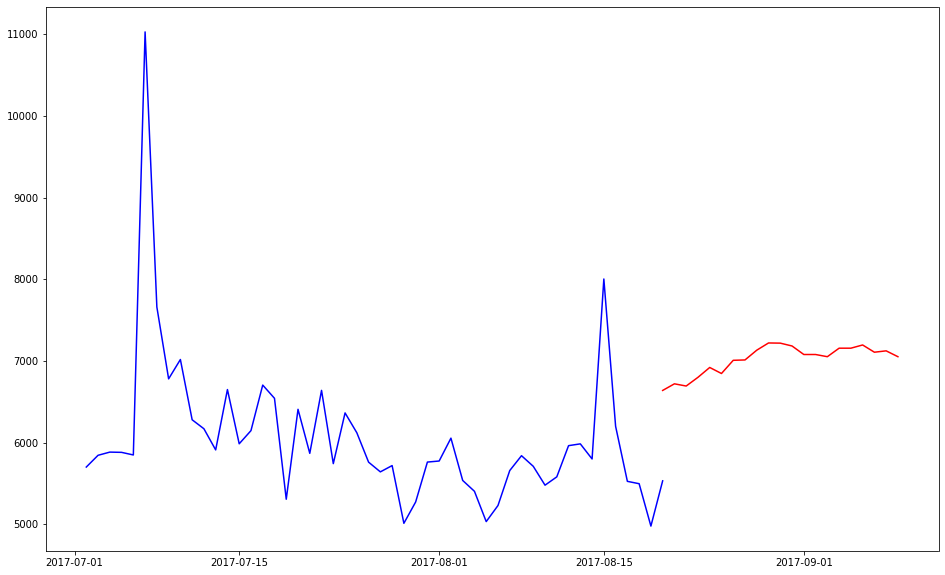

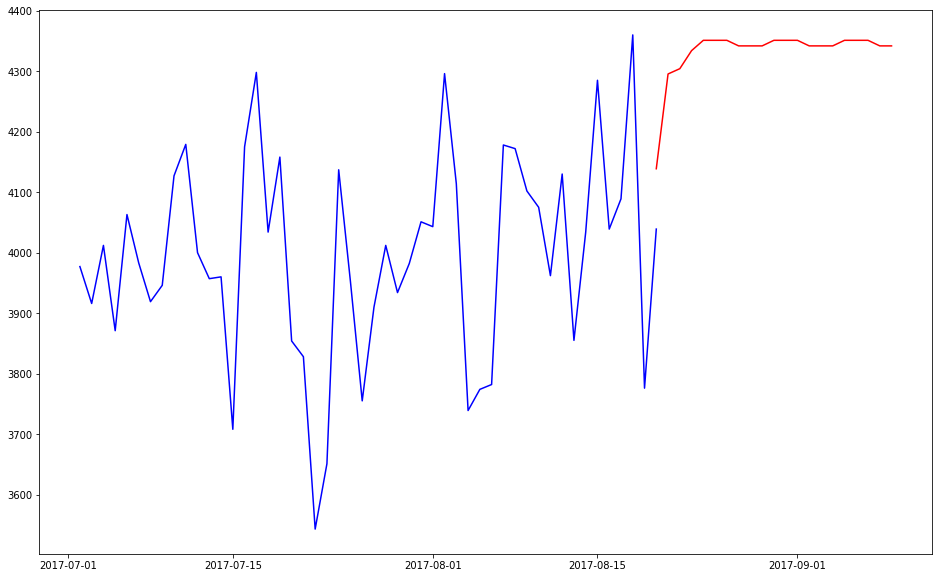

...

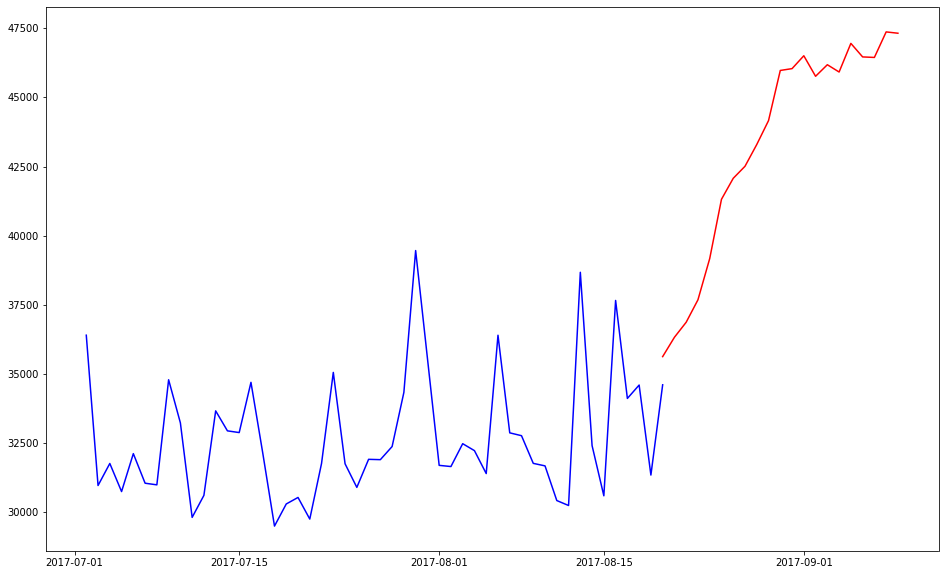

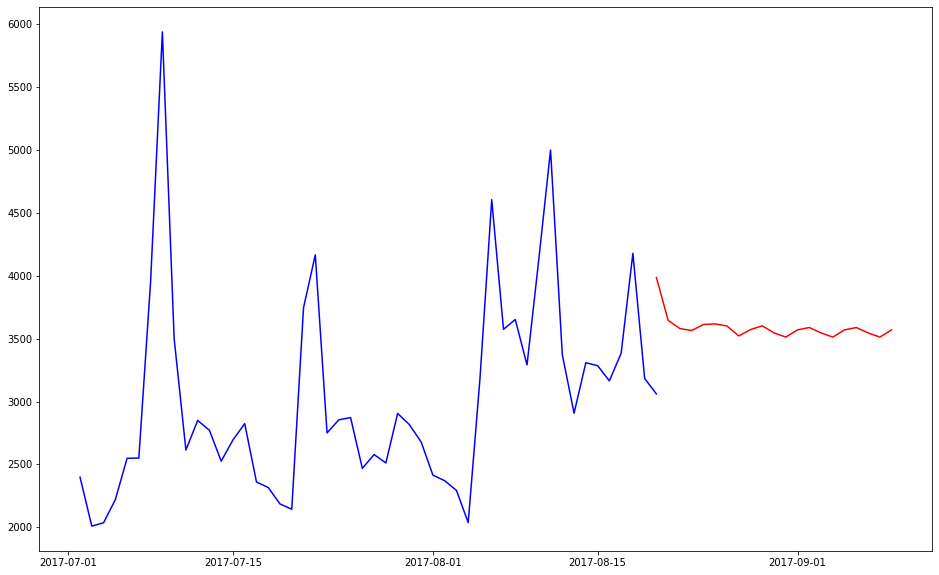

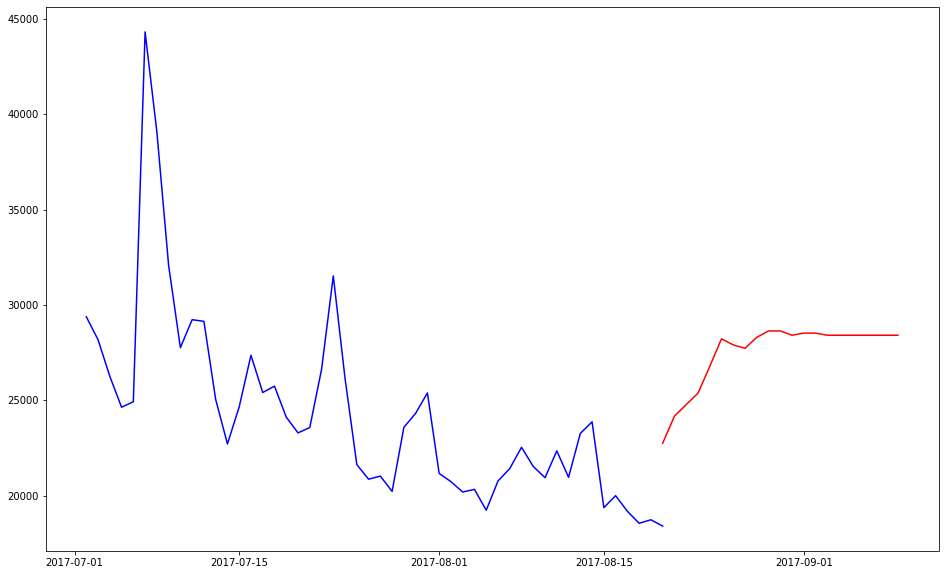

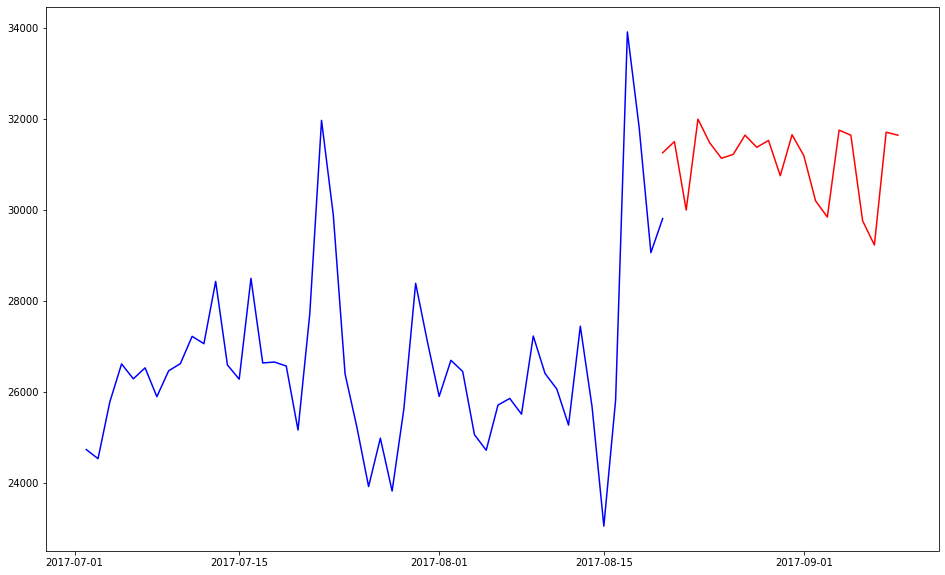

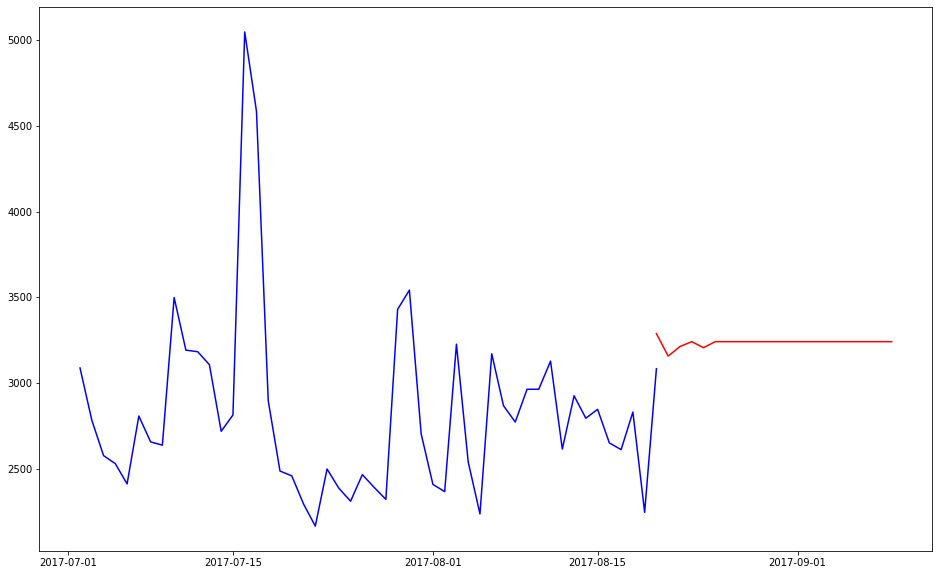

In [207]:
for column in df.columns:
    plt.figure(figsize=(16,10))
    
    plt.plot(df.tail(50)[column], color='blue')
    # plt.plot(new_df[column], color='green')
    plt.plot(new_dfc[column], color='red')
    
    plt.show()

In [208]:
def keyvalue(df):
    """
    Transforms dataframe from the predictions in dataframe format (horizon x 45 i.e. one column of predictions per
    series) to the required format by Kaggle.
    :param df:
    :return:
    """
    df["horizon"] = range(1, df.shape[0] + 1)
    res = pd.melt(df, id_vars=["horizon"])
    res = res.rename(columns={"variable": "series"})
    res["Id"] = res.apply(lambda row: "s" + str(row["series"].split("-")[1]) + "h" + str(row["horizon"]), axis=1)
    res = res.drop(['series', 'horizon'], axis=1)
    res = res[["Id", "value"]]
    res = res.rename(columns={"value": "forecasts"})
    return res

In [209]:
sub = keyvalue(future_unscaled)
sub.to_csv("submission_reg_test.csv", index=False)

In [210]:
sub2 = keyvalue(new_dfc)
sub2.to_csv("submission_reg_test.csv", index=False)

In [212]:
print(new_dfc.shape)

(21, 46)


In [213]:
print(new_dfc.head())

               series-1     series-2       series-3     series-4     series-5  \
2017-08-20  6438.847364  5959.768581  131989.738007  6638.213565  4138.732114   
2017-08-21  6398.083560  6010.965148  142038.384242  6719.295534  4295.411695   
2017-08-22  6454.034093  6082.559341  140479.324572  6692.238046  4304.170571   
2017-08-23  6462.885904  6129.442113  136077.390014  6798.776509  4333.997575   
2017-08-24  6431.242902  6146.542530  124214.316705  6919.504463  4351.064362   

                series-6      series-7      series-8      series-9  \
2017-08-20  1.141254e+06  47653.079924  15882.439994  82725.833234   
2017-08-21  1.182558e+06  49817.490644  15806.247710  83380.136964   
2017-08-22  1.167897e+06  52871.637314  16026.050004  76940.324768   
2017-08-23  1.159139e+06  53342.122652  16037.946487  80132.297587   
2017-08-24  1.164683e+06  51394.420362  16037.946487  84738.215017   

                series-10  ...     series-37    series-38    series-39  \
2017-08-20   94437